# Computer Vision Project
#### Introduction to Machine learning course | Instructor: Dr. Fatemeh Mirsalehi

<font color='cyan'> Responsible TA: Amirhossein Razlighi </font>

In [ ]:
%pip install torch torchvision numpy matplotlib Pillow

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (99 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21

In [6]:
pip install torchsummary


In [7]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt

## Section 1: Implementing a CNN from scratch! (30 points)

### 1.1 - Forward and Backward (20/30 pts)

__CNN__ s are powerfull tools to work with in the scope of _Computer Vision_. You have seen MLPs before and know how to do forward and backward pass on them. In this part, we want to create a convolutional layer (a simple one, of course!) just to understand well that how a Convolutional Layer works, behind the scenes. Then, we can simply use PyTorch's `Conv2D` layer for the rest of this project, because we understood that how Convolutions work, behind the scene!

__FORWARD PASS__:

In forward pass, you should apply the convolution operation on the input image. The convolution operation is as follows:

$$
\text{output}[i, j] = \sum_{k=0}^{K-1} \sum_{l=0}^{L-1} \text{input}[i+k, j+l] \times \text{kernel}[k, l]
$$

You can see a sample convolution operation (with a $3 \times 3$ kernel) in the following image:
<div style="text-align:center;">
  <img src="./Images/Conv.gif" />
</div>

Please note that, these are samples for you to understand the operation better. For _forward pass_ that you should implement, please notice that you should convolve the kernel along all $C$ channels of the input image. So, the output shape should be $(N, H_{out}, W_{out})$. These values are calculated as follows:

$$
H_{out} = \frac{H_{in} + 2 \times \text{padding}}{\text{stride} - HH} + 1
$$
$$
W_{out} = \frac{W_{in} + 2 \times \text{padding}}{\text{stride} - WW} + 1
$$


where $HH$ and $WW$ are the height and width of the kernel, respectively. __stride__ is the step size of the kernel, and __padding__ is the number of zeros that should be padded to the input image. Please also note that $b$ stands for bias, which is a scalar value that should be added to the output of the convolution operation. (for each kernel)

You can see a more detailed example, below:

<div style="text-align:center;">
  <img src="./Images/conv3.gif" />
</div>

__Backward Pass__:

In backward pass, you should calculate gradient of output with respect to the input image and the kernel. These gradients will be used in _optimization_ to update kernel weights. (You saw something similar, in using MLPs with gradient descent algorithm!). So, we need $d_x$, $d_w$ and $d_b$ in the backward pass. These are calculated as follows:

$$
dx_{padded} [n, :, i * stride: i * stride + HH, j * stride: j * stride + WW] += w[f] \times dout[n, f, i, j]
$$

$$
dw_{f} = \sum_{n=0}^{N - 1} \sum_{i=0}^{H_{out} - 1} \sum_{j=0}^{W_{out} - 1} x_{padded}[n, :, i * stride: i * stride + HH, j * stride: j * stride + WW] \times dout[n, f, i, j]  
$$

$$
db_{f} = \sum_{n=0}^{N - 1} \sum_{i=0}^{H_{out} - 1} \sum_{j=0}^{W_{out} - 1} dout[n, f, i, j]
$$

For better understanding of the backward pass, you can see the following image:

<div style="text-align:center;">
  <img src="./Images/backprop_cs231n.png" />
</div>


In [8]:
def conv_backward(dout, cache):
  """
  Perform convolutional backpropagation
  dout: downstream derivative
  cache: caches from foward pass
  """
  x, w, b, stride, padding = cache
  N, C, H, W = x.shape
  F, _, FH, FW = w.shape

  padded_x = np.pad(x, ((0, 0), (0, 0), (padding, padding), (padding, padding)), mode='constant')
  _, _, padded_H, padded_W = padded_x.shape

  dx = np.zeros_like(x)
  dw = np.zeros_like(w)
  db = np.zeros_like(b)

  x_col = np.zeros((C * FH * FW, H * W))
  w_row = w.reshape(F, C * FH * FW)

  for i in range(N):
    curr_dout = dout[i, :, :, :].reshape(F, H * W)
    curr_out = np.dot(w_row.T, curr_dout)
    curr_dpx = np.zeros(padded_x.shape[1:])
    c = 0
    for j in range(0, padded_H - FH + 1, stride):
      for k in range(0, padded_W - FW + 1, stride):
        curr_dpx[:, j:j+FH, k:k+FW] += curr_out[:, c].reshape(C, FH, FW)
        x_col[:, c] = padded_x[i, :, j:j+FH, k:k+FW].reshape(C * FH * FW)
        c += 1
    dx[i] = curr_dpx[:, padding:-padding, padding:-padding]
    dw += np.dot(curr_dout, x_col.T).reshape(F, C, FH, FW)
    db += np.sum(curr_dout, axis=1)

  return dx, dw, db

def relu_backward(dout, cache):
  """
  ReLU backpropagation.
  dout: downstream derivative
  cache: cache from forward pass
  """
  x = cache
  dx = dout * (x > 0)

  return dx

def fc_backward(dout, cache):
  """
  Fully-connected layer backpropagation.
  dout: downstream derivative
  cache: cache from forward pass
  """
  x, w, b = cache
  N = x.shape[0]
  x_new = x.reshape(N, -1)

  dx = np.dot(dout, w.T).reshape(x.shape)
  dw = np.dot(x_new.T, dout)
  db = np.sum(dout.T, axis=1)

  return dx, dw, db

In [9]:
import numpy as np

class MyConv:
    def __init__(self, stride, padding):
        self.stride = stride
        self.padding = padding

    def forward(self, x, w, b):
        N, C, H, W = x.shape
        F, _, HH, WW = w.shape
        pad = self.padding
        stride = self.stride
        H_out = (H + 2 * pad - HH) // stride + 1
        W_out = (W + 2 * pad - WW) // stride + 1

        x_pad = np.pad(x, ((0, 0), (0, 0), (pad, pad), (pad, pad)), mode='constant')

        out = np.zeros((N, F, H_out, W_out))

        for n in range(N):
            for f in range(F):
                for k in range(H_out):
                    for l in range(W_out):
                        out[n, f, k, l] = np.sum(
                            x_pad[n, :, k * stride:k * stride + HH, l * stride:l * stride + WW] * w[f]
                        ) + b[f]

        cache = (x, w, b, x_pad)
        self.cache = cache
        return out

    def backward(self, dout):
        x, w, b, x_padded = self.cache
        N, C, H, W = x.shape
        F, C_filter, HH, WW = w.shape
        N, F, H_out, W_out = dout.shape

        dw = np.zeros_like(w)
        dx_padded = np.zeros_like(x_padded)
        db = np.zeros_like(b)

        pad = self.padding
        stride = self.stride

        for n in range(N):
            for f in range(F):
                for i in range(H_out):
                    for j in range(W_out):
                        # Update gradients for dw
                        dw[f] += x_padded[n, :, i * stride:i * stride + HH, j * stride:j * stride + WW] * dout[n, f, i, j]

                        dx_padded[n, :, i * stride:i * stride + HH, j * stride:j * stride + WW] += w[f] * dout[n, f, i, j]

                        db[f] += dout[n, f, i, j]

        if pad > 0:
            dx = dx_padded[:, :, pad:-pad, pad:-pad]
        else:
            dx = dx_padded

        self.dx = dx
        self.dw = dw
        self.db = db

        return dx, dw, db


In [10]:
def rel_error(x, y):
  return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

In [11]:
def eval_numerical_gradient_array(f, x, df, h=1e-5):
  grad = np.zeros_like(x)
  it = np.nditer(x, flags=['multi_index'], op_flags=['readwrite'])
  while not it.finished:
    ix = it.multi_index

    oldval = x[ix]
    x[ix] = oldval + h
    pos = f(x).copy()
    x[ix] = oldval - h
    neg = f(x).copy()
    x[ix] = oldval

    grad[ix] = np.sum((pos - neg) * df) / (2 * h)
    it.iternext()
  return grad

In [12]:
# A simple test for forward pass (DO NOT CHANGE)

x_shape = (2, 3, 4, 4)
w_shape = (3, 3, 4, 4)
x = np.linspace(-0.1, 0.5, num=np.prod(x_shape)).reshape(x_shape)
w = np.linspace(-0.2, 0.3, num=np.prod(w_shape)).reshape(w_shape)
b = np.linspace(-0.1, 0.2, num=3)

out = MyConv(stride=2, padding=1).forward(x, w, b)
correct_out = np.array([[[[[-0.08759809, -0.10987781],
                           [-0.18387192, -0.2109216 ]],
                          [[ 0.21027089,  0.21661097],
                           [ 0.22847626,  0.23004637]],
                          [[ 0.50813986,  0.54309974],
                           [ 0.64082444,  0.67101435]]],
                         [[[-0.98053589, -1.03143541],
                           [-1.19128892, -1.24695841]],
                          [[ 0.69108355,  0.66880383],
                           [ 0.59480972,  0.56776003]],
                          [[ 2.36270298,  2.36904306],
                           [ 2.38090835,  2.38247847]]]]])

# The outputted difference which is printed, should be around 1e-8
print ('Testing conv_forward_naive')
print ('difference: ', rel_error(out, correct_out))

Testing conv_forward_naive
difference:  2.2121476417505994e-08


In [13]:
# A simple test for backward pass (DO NOT CHANGE)

x = np.random.randn(4, 3, 5, 5)
w = np.random.randn(2, 3, 3, 3)
b = np.random.randn(
    2,
)
dout = np.random.randn(4, 2, 5, 5)
conv = MyConv(stride=1, padding=1)

dx_num = eval_numerical_gradient_array(
    lambda x: conv.forward(x, w, b), x, dout
)
dw_num = eval_numerical_gradient_array(
    lambda w: conv.forward(x, w, b), w, dout
)
db_num = eval_numerical_gradient_array(
    lambda b: conv.forward(x, w, b), b, dout
)

out = conv.forward(x, w, b)
dx, dw, db = conv.backward(dout)

# Your printed errors should be around 1e-9
print("Testing conv_backward_naive function")
print("dx error: ", rel_error(dx, dx_num))
print("dw error: ", rel_error(dw, dw_num))
print("db error: ", rel_error(db, db_num))

Testing conv_backward_naive function
dx error:  1.5770802531566256e-09
dw error:  4.128024515308319e-10
db error:  1.933796993991962e-11


### 1.2 - Visualizing Convolution results (10/30 pts)

In this part, we try to visualize the results of the convolution operation. We will 2 sample photos (in `Images/Sample`) and then we will use our `MyConv` class to apply some cool convolutions (and see their result on an image).

In [14]:
from PIL import Image
first_img, second_img = Image.open("/content/Sharif_1.JPG"
), Image.open(
    "/content/Sharif_2.jpg"

)
first_img = first_img.resize((256, 256))
second_img = second_img.resize((256, 256))

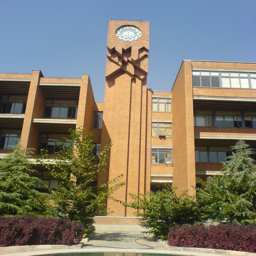

In [15]:
first_img

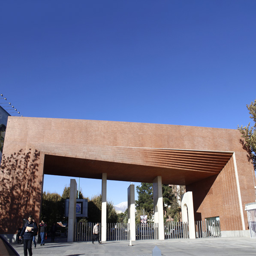

In [16]:
second_img

Convolutions have some interesting usages in image processing. For example, you can extract edges from an image by applying a convolution with a kernel that detects edges. Or you can convolve a specific kernel with your image to make it grayscale or blurred! Look at the definitions below:

__Edge Detection Kernel__:

_Sobel_ is one of the most famous edge detection kernels. It has two kernels, one for detecting vertical edges and the other for horizontal edges. You can see the kernels below:
$$
\text{Sobel}_x = \begin{bmatrix}
-1 & 0 & 1 \\
-2 & 0 & 2 \\
-1 & 0 & 1
\end{bmatrix}
$$

$$
\text{Sobel}_y = \begin{bmatrix}
-1 & -2 & -1 \\
0 & 0 & 0 \\
1 & 2 & 1
\end{bmatrix}
$$


__Grayscale Kernel__:

You can simply convolve the image with the following kernel to make it grayscale:

$$
\text{Grayscale\_across\_R} = \begin{bmatrix}
0 & 0 & 0 \\
0 & 0.3 & 0 \\
0 & 0 & 0
\end{bmatrix}
$$

$$
\text{Grayscale\_across\_G} = \begin{bmatrix}
0 & 0 & 0 \\
0 & 0.6 & 0 \\
0 & 0 & 0
\end{bmatrix}
$$

$$
\text{Grayscale\_across\_B} = \begin{bmatrix}
0 & 0 & 0 \\
0 & 0.1 & 0 \\
0 & 0 & 0
\end{bmatrix}
$$

(Convolve each kernel with its corresponding channel)

__Blurring Kernel__:

One of the famous kernels to blur an image is _Gaussian Blur_. You can see the kernel below:

$$
\text{Gaussian\_Blur} = \frac{1}{16} \times \begin{bmatrix}
1 & 2 & 1 \\
2 & 4 & 2 \\
1 & 2 & 1
\end{bmatrix}
$$


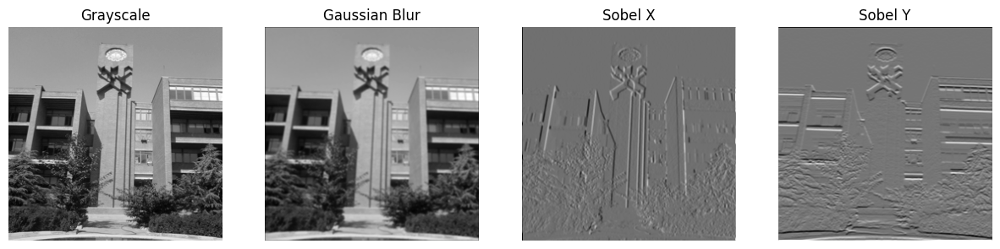

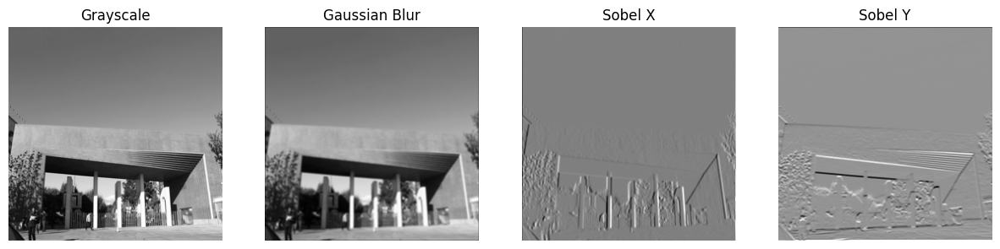

In [17]:
img_size = 256

x = np.zeros((2, 3, img_size, img_size))
x[0] = np.array(first_img).transpose(2, 0, 1)
x[1] = np.array(second_img).transpose(2, 0, 1)

# Define Grayscale kernels
grayscale_r = np.array([
    [0, 0, 0],
    [0, 0.3, 0],
    [0, 0, 0]
])

grayscale_g = np.array([
    [0, 0, 0],
    [0, 0.6, 0],
    [0, 0, 0]
])

grayscale_b = np.array([
    [0, 0, 0],
    [0, 0.1, 0],
    [0, 0, 0]
])

# Define Gaussian Blur kernel
gaussian_blur_kernel = (1/16) * np.array([
    [1, 2, 1],
    [2, 4, 2],
    [1, 2, 1]
])

# Define Sobel kernels
sobel_x_kernel = np.array([
    [1, 0, -1],
    [2, 0, -2],
    [1, 0, -1]
])

sobel_y_kernel = np.array([
    [1, 2, 1],
    [0, 0, 0],
    [-1, -2, -1]
])

# Expand dimensions to fit (F, C, HH, WW) format
grayscale_r_kernel = np.tile(grayscale_r[np.newaxis, np.newaxis, :, :], (1, 3, 1, 1))
grayscale_g_kernel = np.tile(grayscale_g[np.newaxis, np.newaxis, :, :], (1, 3, 1, 1))
grayscale_b_kernel = np.tile(grayscale_b[np.newaxis, np.newaxis, :, :], (1, 3, 1, 1))

gaussian_blur_kernel = np.repeat(gaussian_blur_kernel[np.newaxis, np.newaxis, :, :], 3, axis=1)
sobel_x_kernel = np.repeat(sobel_x_kernel[np.newaxis, np.newaxis, :, :], 3, axis=1)
sobel_y_kernel = np.repeat(sobel_y_kernel[np.newaxis, np.newaxis, :, :], 3, axis=1)

# Stack all kernels
w = np.concatenate([grayscale_r_kernel, grayscale_g_kernel, grayscale_b_kernel, gaussian_blur_kernel, sobel_x_kernel, sobel_y_kernel], axis=0)

# Bias
b = np.array([0, 0, 0, 0, 0, 0])

# Create MyConv instance
conv = MyConv(stride=1, padding=1)

# Apply convolution
out = conv.forward(x, w, b)

# Extract outputs for each filter
grayscale_output = np.sum(out[:, :3, :, :], axis=1)  # Sum across the three grayscale filters
gaussian_blur_output = out[:, 3, :, :]
sobel_x_output = out[:, 4, :, :]
sobel_y_output = out[:, 5, :, :]

def plot_images(images, titles, cmap=None):
    n = len(images)
    plt.figure(figsize=(15, 5))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow(images[i], cmap=cmap)
        plt.title(titles[i])
        plt.axis('off')
    plt.show()

for i in range(2):
    plot_images(
        [
            grayscale_output[i],
            gaussian_blur_output[i],
            sobel_x_output[i],
            sobel_y_output[i]
        ],
        ['Grayscale', 'Gaussian Blur', 'Sobel X', 'Sobel Y'],
        cmap='gray'
    )


In [18]:
import matplotlib.pyplot as plt

#TODO: Plot the original image, grayscale, sobel x, sobel y, and gaussian blur of each image

Now that we understood how Convolution works, we proceed further to use it in our models to perform a desired and specific task! We can use PyTorch's `Conv2D` layer from now on, because we understood how Convolutions work, behind the scene!

## Section 2: Neural Style Transfer (90 points)

In this part, we are going to implement a famous technique in the field of _Computer Vision_ called __Neural Style Transfer__. This technique is used to apply the style of a specific image to another image. For example, you can apply the style of a famous painting to your photo! Let's get started!

### 2.1 - Importing Libraries

In [19]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
from torchvision.models import vgg19, VGG19_Weights

import copy

In [20]:
device = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "mps" if torch.backends.mps.is_available() else "cpu"
)
torch.set_default_device(device)
device

device(type='cpu')

### 2.2 - Loading Images and doing some Preprocessing (5/90 pts)

In this part, you should load the content and style images and preprocess them. Preprocessing includes resizing the images to a specific size, normalizing them, and converting them to PyTorch tensors. You can use `torchvision.transforms` to do these tasks.

In [21]:
import torch
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt

img_size = 512 if not device == "cpu" else 256

loader = transforms.Compose(
    [
        transforms.Resize((img_size, img_size)),
        transforms.ToTensor(),
    ]
)

def image_loader(image_name):
    image = Image.open(image_name)
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float32)

style_image = image_loader("/content/style.jpeg")
content_image = image_loader("/content/Content.jpeg")

style_image.size(), content_image.size()


(torch.Size([1, 3, 512, 512]), torch.Size([1, 3, 512, 512]))

Here, you should implement a helper function to show you images (which are now in form of pytorch tensors) in the notebook. You can use `torchvision.transforms.ToPILImage` to convert a tensor to a PIL image.

In [22]:
plt.ion()

def imshow(tensor, title=None):
    image = tensor.cpu().clone()
    image = image.squeeze(0)
    image = transforms.ToPILImage()(image)
    plt.imshow(image)
    plt.axis("off")
    if title is not None:
        plt.title(title)



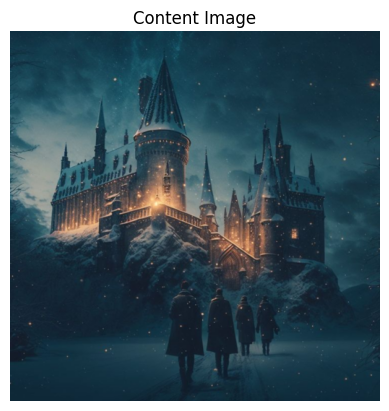

In [23]:
imshow(content_image, "Content Image")

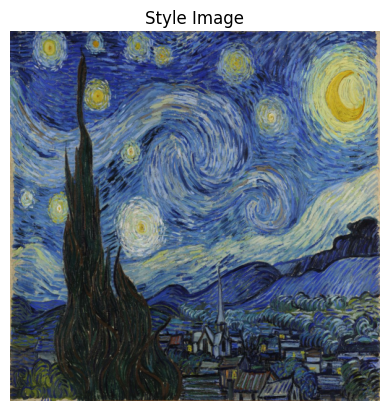

In [24]:
imshow(style_image, "Style Image")

### 2.2 - VGG19 Model (15/90 pts)

One of the important parts of Neural Style Transfer is to use a pre-trained model to extract features from the content and style images. Here, we are going to use a pre-trained VGG19 model to extract features from the images. You can use `torchvision.models.vgg19` to load the model. You should also freeze the weights of the model to prevent them from updating during the optimization process.

<div style="text-align:center;">
  <img src="./Images/VGG-19.png" />
</div>

But what is VGG model? Let's see with a simple experiment:

In [25]:
import certifi
import os

os.environ['SSL_CERT_FILE'] = certifi.where()

Here, please load `VGG19` model from `torchvision.models` and see the architecture of the model. You may need models `features` and `classifier` part stored seperately as we will discuss these both parts.

In [26]:
import torchsummary
from torchvision import models
from torchsummary import summary

vgg_model = models.vgg19(pretrained=True)

vgg_model_features = vgg_model.features
vgg_model_classifier = vgg_model.classifier

vgg_model = vgg_model.to('cuda' if torch.cuda.is_available() else 'cpu')
summary(vgg_model, input_size=(3, 512, 512))


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:04<00:00, 133MB/s]


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 512, 512]           1,792
              ReLU-2         [-1, 64, 512, 512]               0
            Conv2d-3         [-1, 64, 512, 512]          36,928
              ReLU-4         [-1, 64, 512, 512]               0
         MaxPool2d-5         [-1, 64, 256, 256]               0
            Conv2d-6        [-1, 128, 256, 256]          73,856
              ReLU-7        [-1, 128, 256, 256]               0
            Conv2d-8        [-1, 128, 256, 256]         147,584
              ReLU-9        [-1, 128, 256, 256]               0
        MaxPool2d-10        [-1, 128, 128, 128]               0
           Conv2d-11        [-1, 256, 128, 128]         295,168
             ReLU-12        [-1, 256, 128, 128]               0
           Conv2d-13        [-1, 256, 128, 128]         590,080
             ReLU-14        [-1, 256, 1

Please briefly explain what is a VGG model used for and what does each `features` and `classifier` part, represent?

**Your Answer:**

...

Now, we are going to give a sample image `Images/Neural_Transfer/Car.jpeg` to the model, see the output for classification and also visualize the feature maps (outputs of each convolutional layer) to see what's going on!

As you can see, the output of the classifier is an integer. This integer is actually the **class number** in _Image Net_ dataset. Let's get the name of the class:

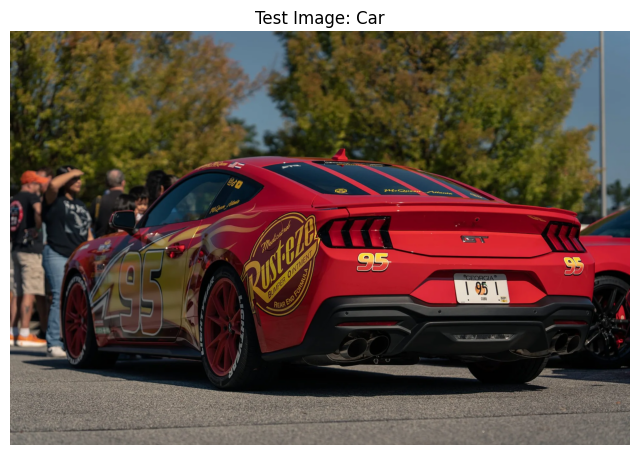

Top-1 Prediction:
  Label: "sports car",
  Index: 817
  Probability: 0.3025

Top-2 Prediction:
  Label: "race car",
  Index: 751
  Probability: 0.2000

Top-3 Prediction:
  Label: "car wheel",
  Index: 479
  Probability: 0.1085

Top-4 Prediction:
  Label: "pickup truck",
  Index: 717
  Probability: 0.0292

Top-5 Prediction:
  Label: "convertible",
  Index: 511
  Probability: 0.0261



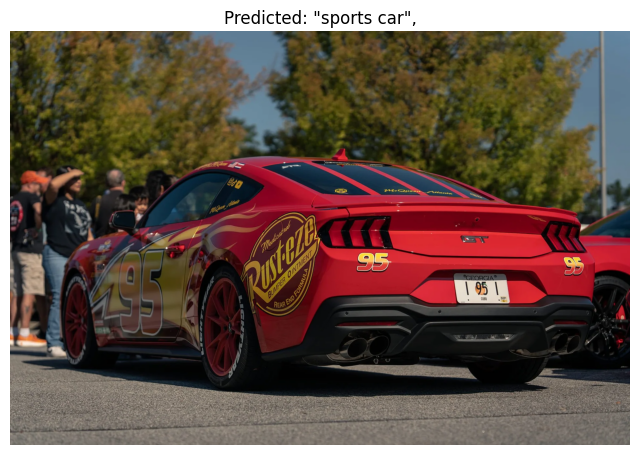

In [27]:
import torch
from torchvision import transforms
from PIL import Image
import requests

vgg_model = models.vgg19(pretrained=True)
vgg_model.eval()

vgg_test_image = Image.open("/content/Car.jpeg")

plt.figure(figsize=(8, 8))
plt.imshow(vgg_test_image)
plt.title('Test Image: Car')
plt.axis('off')
plt.show()

preprocess_vgg = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

input_tensor = preprocess_vgg(vgg_test_image)
input_batch = input_tensor.unsqueeze(0)  # Create a mini-batch as expected by the model

with torch.no_grad():
    output = vgg_model(input_batch)

probabilities = torch.nn.functional.softmax(output[0], dim=0)
predicted_probabilities, predicted_indices = torch.topk(probabilities, 5)
predicted_probabilities = predicted_probabilities.numpy()
predicted_indices = predicted_indices.numpy()

url = "https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json"
response = requests.get(url)
labels = np.array(response.text.split("\n"))

predicted_labels = [labels[idx] for idx in predicted_indices]
predicted_indices = [idx.item() for idx in predicted_indices]

for i, (label, prob) in enumerate(zip(predicted_labels, predicted_probabilities), 1):
    print(f"Top-{i} Prediction:")
    print(f"  Label: {label}")
    print(f"  Index: {predicted_indices[i-1]}")
    print(f"  Probability: {prob:.4f}")
    print()


plt.figure(figsize=(8, 8))
plt.imshow(vgg_test_image)
plt.title(f'Predicted: {predicted_labels[0]}')
plt.axis('off')
plt.show()


Now that we understood the architecture of VGG, and also the output of its classifier, it's time to extract features from the images! And see what's going on in the feature maps!

Layer 1: Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


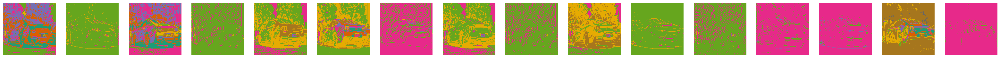

Layer 2: Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


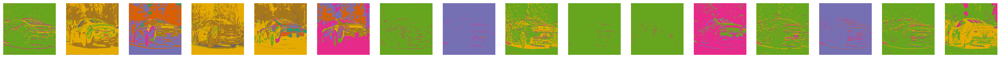

Layer 3: Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


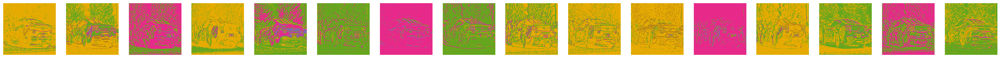

Layer 4: Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


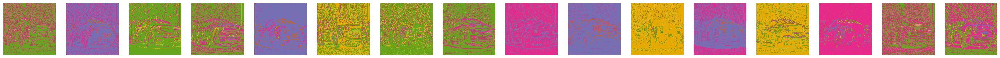

Layer 5: Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


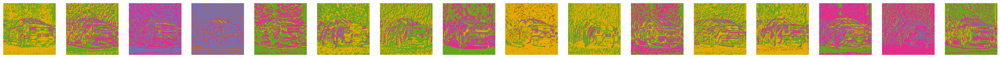

Layer 6: Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


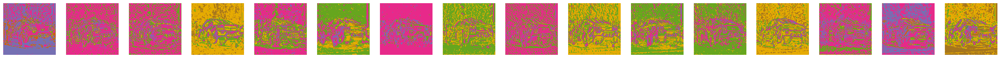

Layer 7: Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


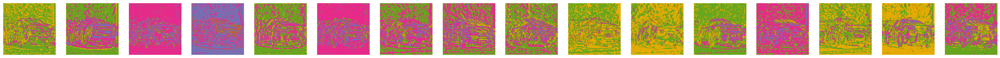

Layer 8: Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


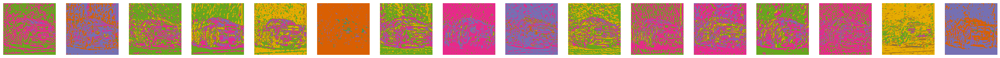

Layer 9: Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


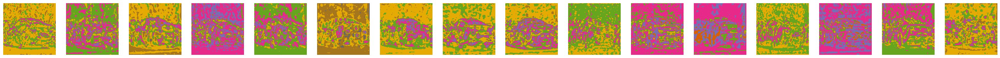

Layer 10: Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


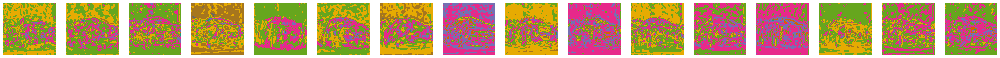

Layer 11: Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


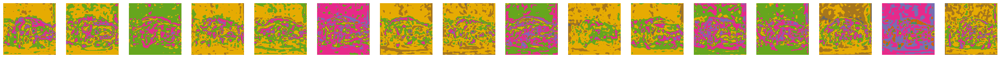

Layer 12: Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


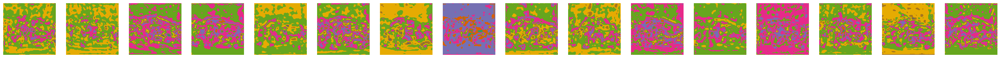

Layer 13: Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


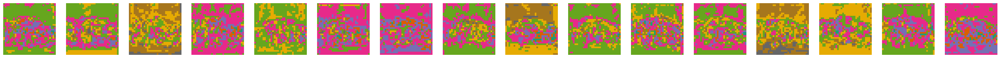

Layer 14: Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


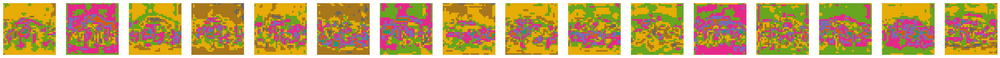

Layer 15: Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


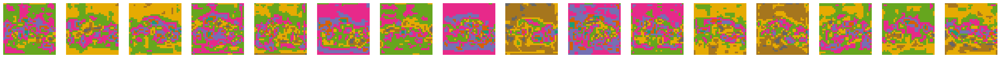

Layer 16: Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


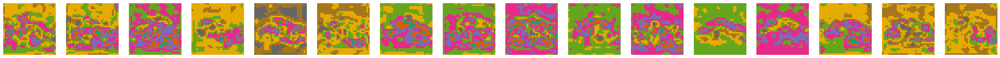

In [28]:
from PIL import Image

vgg_model = models.vgg19(pretrained=True).features
vgg_model.eval()

vgg_test_image = Image.open("/content/Car.jpeg")

preprocess_vgg = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

input_tensor = preprocess_vgg(vgg_test_image)
input_batch = input_tensor.unsqueeze(0)

def visualize_feature_maps(feature_maps, num_feature_maps=16):
    num_feature_maps = min(num_feature_maps, feature_maps.shape[1])
    fig, axes = plt.subplots(1, num_feature_maps, figsize=(40, 40))
    for i in range(num_feature_maps):
        ax = axes[i]
        ax.imshow(feature_maps[0, i].cpu().detach().numpy(), cmap='Dark2')
        ax.axis('off')
    plt.show()

x = input_batch
conv_layer_counter = 0
for name, layer in vgg_model._modules.items():
    x = layer(x)
    if isinstance(layer, torch.nn.Conv2d):
        conv_layer_counter += 1
        print(f"Layer {conv_layer_counter}: {layer}")
        visualize_feature_maps(x, num_feature_maps=16)


It's fun too look under the hood, isn't it? As you can see, we can guess what are the learned features in each layer if the network (at least in the first layers). For example, in the first layer, the network learns to detect edges, and in the second layer, it learns to detect simple shapes. In the deeper layers, the network learns to detect more complex features.

### 2.3 - Content and Style Loss (15/90 pts)

In order to learn the correct image and keep the content of the original image while applying the style of the seconf image, we need 2 losses: 1. Content Loss and 2. Style Loss. Let's delve into each one!

**Content Loss** is responsible for keeping the content of the original image. It is calculated as the mean squared error between the feature maps of the original image and the generated image.

In [29]:
class ContentLoss(nn.Module):
    def __init__(self, target):
        super(ContentLoss, self).__init__()
        self.target = target.detach()

    def forward(self, input):
        self.loss = F.mse_loss(input, self.target)
        return input

**Style Loss** is responsible for applying the style of the second image to the generated image. It is calculated as the mean squared error between the Gram matrices of the feature maps of the second image and the generated image.

In [30]:
def gram_matrix(input):
    a, b, c, d = input.size()

    features = input.view(a * b, c * d)
    G = torch.mm(features, features.t())

    return G.div(a * b * c * d)

In [31]:
class StyleLoss(nn.Module):

    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()

    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target)
        return input

Now, we use `features` part of the VGG model to extract features from the content and style images. Then, we calculate the content and style loss using the extracted features.

In [32]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
import copy

In [33]:
cnn = vgg19(weights=VGG19_Weights.DEFAULT).features.eval()

cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406])
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225])


class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        self.mean = torch.tensor(mean).view(-1, 1, 1)
        self.std = torch.tensor(std).view(-1, 1, 1)

    def forward(self, img):
        return (img - self.mean) / self.std


Please note that after which layers you should calculate the content loss and after which ones, you should calculate the style loss. Use the layer names you saw earlier in the `torchsummary` output for VGG19 model.

In [61]:
#choose layers base on your img or standard layers
#standard img :
#content_layers_default = ["conv_4"]
#style_layers_default = ["conv_1", "conv_2", "conv_3", "conv_4", "conv_5"]


content_layers_default = ["conv_2","conv_4", "conv_5"]
style_layers_default = ["conv_1", "conv_2", "conv_3", "conv_4", "conv_5"]

def get_features_and_losses(
    cnn,
    normalization_mean,
    normalization_std,
    style_img,
    content_img,
    content_layers=content_layers_default,
    style_layers=style_layers_default,
):
    normalization = Normalization(normalization_mean, normalization_std)

    # losses
    content_losses = []
    style_losses = []

    model = nn.Sequential(normalization)

    i = 0
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = "conv_{}".format(i)
        elif isinstance(layer, nn.ReLU):
            name = "relu_{}".format(i)
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = "pool_{}".format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = "bn_{}".format(i)
        else:
            raise RuntimeError(
                "Unrecognized layer: {}".format(layer.__class__.__name__)
            )

        model.add_module(name, layer)

        if name in content_layers:
            target = model(content_img).detach()
            content_loss = ContentLoss(target)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)

        if name in style_layers:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)

    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[: (i + 1)]

    return model, style_losses, content_losses

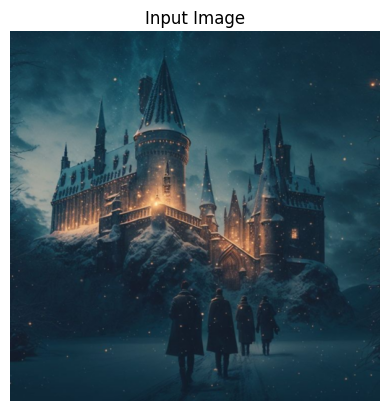

In [62]:
input_img = content_image.clone()

plt.figure()
imshow(input_img, title='Input Image')

(15/90 pts) Now, we need to define our optimizer. We use `LBFGS` optimizer. Let's get familiar with this optimizer a little bit:

Let's use this optimizer to optimize a simple function $f(x) = x^2$. We want to find the minimum of this function using `LBFGS` optimizer. First, you should initialize a tensor $x$ with a random value. Then, you should define a closure function that calculates the value of the function and its gradient. Finally, you should use the `step` method of the optimizer to update the value of $x$.

And lastly, you should generate an animation using `matplotlib.animation` to show how the value of $x$ changes during optimization.

[10.0, 9.800000190734863, 7.839998245239258, 6.271998405456543, 5.017598628997803, 4.0140790939331055, 3.2112631797790527, 2.5690104961395264, 2.055208444595337, 1.6441667079925537, 1.315333366394043, 1.0522667169570923, 0.8418133854866028, 0.6734507083892822, 0.5387605428695679, 0.4310084581375122, 0.3448067605495453, 0.27584540843963623, 0.22067633271217346, 0.1765410602092743, 0.14123284816741943, 0.11298628151416779, 0.09038902074098587, 0.07231121510267258, 0.0578489750623703, 0.046279177069664, 0.03702334314584732, 0.029618674889206886, 0.02369493991136551, 0.018955951556563377, 0.015164761804044247, 0.012131810188293457, 0.00970544759184122, 0.007764358073472977, 0.006211486645042896, 0.004969188943505287, 0.003975351341068745, 0.003180281026288867, 0.002544224727898836, 0.0020353798754513264, 0.0016283037839457393, 0.0013026430970057845, 0.0010421144543215632, 0.0008336915634572506, 0.0006669532740488648, 0.0005335626192390919, 0.0004268500779289752, 0.0003414800448808819, 0.00

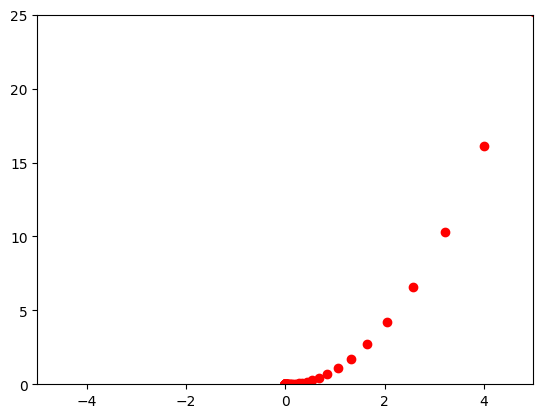

In [36]:
import matplotlib.animation as animation
from IPython.display import HTML

#x = torch.randn(1, requires_grad=True)
x =torch.tensor([10.0], requires_grad= True)
x_values = []

def closure():
    optimizer.zero_grad()
    loss = x ** 2

    loss.backward()
    x_values.append(x.item())
    return loss

optimizer = torch.optim.LBFGS([x], lr = 0.2)


def optimize():
    for i in range(100):
        optimizer.step(closure)

optimize()

fig, ax = plt.subplots()
line, = ax.plot([], [], 'ro')

ax.set_xlim(-5, 5)
ax.set_ylim(0, 25)

def init():
    line.set_data([], [])
    return line,

def update(frame):
    x_val = np.array(x_values[:frame])
    y_val = x_val ** 2
    line.set_data(x_val, y_val)
    return line,

print(x_values)
ani = animation.FuncAnimation(fig, update, frames=len(x_values), init_func=init, blit=True)

ani.save('optimization.gif', writer='imagemagick')

HTML(ani.to_jshtml())


In [52]:
Now, we need to define our optimizer. We use LBFGS optimizer. Let's get familiar with this optimizer a little bit:

Let's use this optimizer to optimize a simple function f(x)=x2. We want to find the minimum of this function using LBFGS optimizer. First, you should initialize a tensor x with a random value. Then, you should define a closure function that calculates the value of the function and its gradient. Finally, you should use the step method of the optimizer to update the value of x.

And lastly, you should generate an animation using matplotlib.animation to show how the value of x changes during optimization.
...

(35/90 pts) Now, let's use this optimizer to optimize our `input_image` to minimize the content and style loss. You should define a closure function that calculates the content and style loss and their gradients. Then, you should use the `step` method of the optimizer to update the value of the `input_image`. Please also **note** that you should use a weighted sum of the content and style loss to optimize the input image. (weight of each loss is a hyperparameter)

In [65]:
def input_optimizer(input_img):

    optimizer = optim.LBFGS([input_img])
    return optimizer

In [70]:
from tqdm.notebook import tqdm


def run_style_transfer(
    cnn,
    normalization_mean,
    normalization_std,
    content_img,
    style_img,
    input_img,
    num_steps=300,
    style_weight=1e5,
    content_weight=1,
):
    model, style_losses, content_losses = get_style_model_and_losses(
        cnn, normalization_mean, normalization_std, style_img, content_img
    )

    input_img.requires_grad_(True)

    model.eval()
    model.requires_grad_(False)

    optimizer = input_optimizer(input_img)
    pbar = tqdm(total=num_steps, desc="Optimizing", dynamic_ncols=True)
    style_losses_lst = []
    content_losses_lst = []
    weighted_losses_lst = []

    j = 0
    for i in range(num_steps):

        def closure():
            nonlocal j
            with torch.no_grad():
                input_img.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_img)
            style_score = 0
            content_score = 0

            for sl in style_losses:
                style_score += sl.loss
            for cl in content_losses:
                content_score += cl.loss

            style_losses_lst.append(style_score)
            content_losses_lst.append(content_score)

            style_score *= style_weight
            content_score *= content_weight

            loss = style_score + content_score
            weighted_losses_lst.append(loss.item())
            loss.backward()
            j += 1
            pbar.set_description(
                f"Iteration: {j}| Style Loss: {style_score.item():.4f}| Content Loss: {content_score.item():.4f}"
            )
            pbar.update()
            if j % 50 == 0:
                plt.figure()
                plt.axis("off")
                plt.imshow(input_img.cpu().detach().squeeze(0).permute(1, 2, 0))
                plt.show()

            return style_score + content_score

        optimizer.step(closure)
        if j >= num_steps:
            break

    with torch.no_grad():
        input_img.clamp_(0, 1)

    return input_img, style_losses_lst, content_losses_lst, weighted_losses_lst

Optimizing:   0%|          | 0/300 [00:00<?, ?it/s]

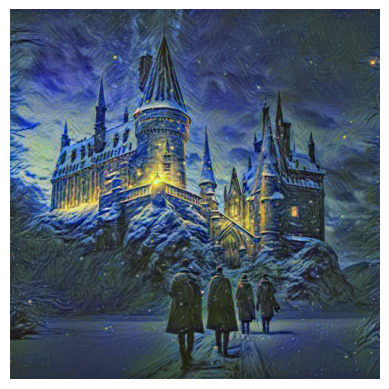

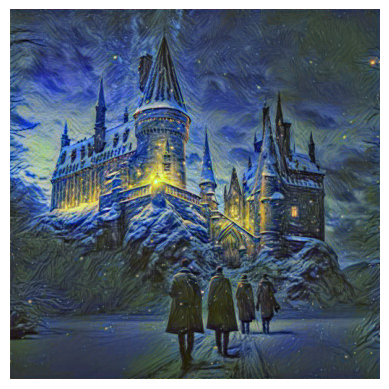

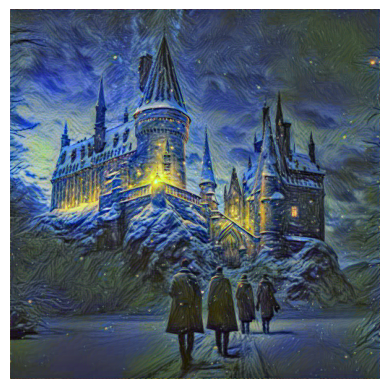

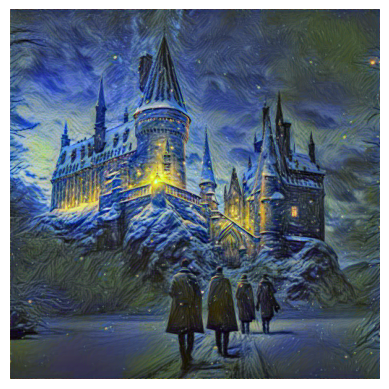

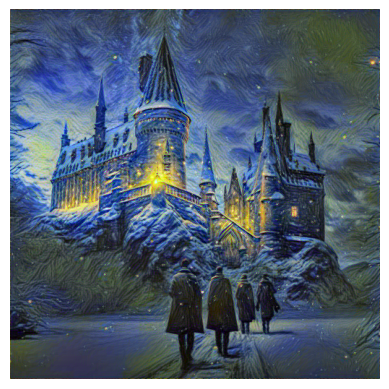

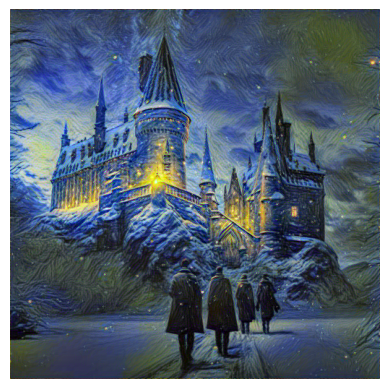

In [71]:
output, style_losses_lst, content_losses_lst, weighted_losses_lst = run_style_transfer(
    cnn,
    cnn_normalization_mean,
    cnn_normalization_std,
    content_image,
    style_image,
    input_img,
)

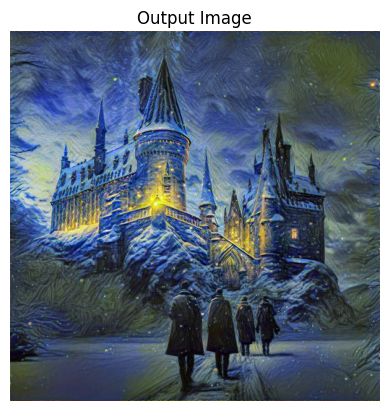

In [72]:
plt.figure()
imshow(output, title="Output Image")

plt.ioff()
plt.show()

Now, let's see the result of optimization process on our `input_image`.

(5/90 pts) Also, let's plot our `style_losses`, `content_losses` and `total_losses` to see how they change during the optimization process.

In [73]:
for i, _ in enumerate(style_losses_lst):
    style_losses_lst[i] = style_losses_lst[i].detach().cpu().numpy()
    content_losses_lst[i] = content_losses_lst[i].detach().cpu().numpy()
    weighted_losses_lst[i] = weighted_losses_lst[i]

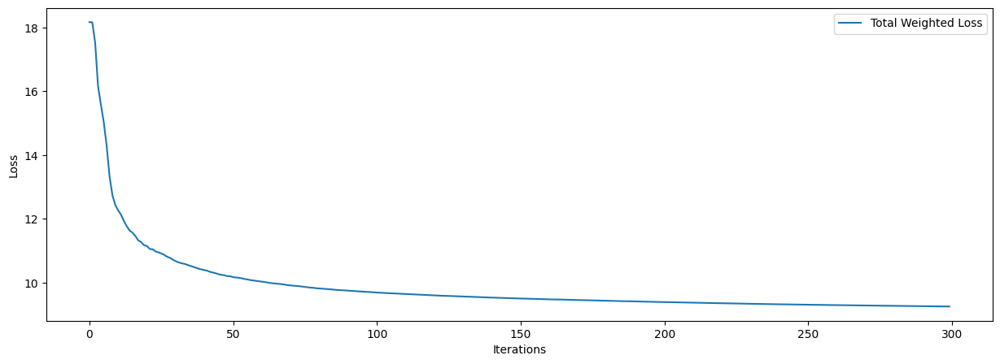

In [74]:
plt.figure(figsize=(15, 5))
plt.plot(weighted_losses_lst, label="Total Weighted Loss")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

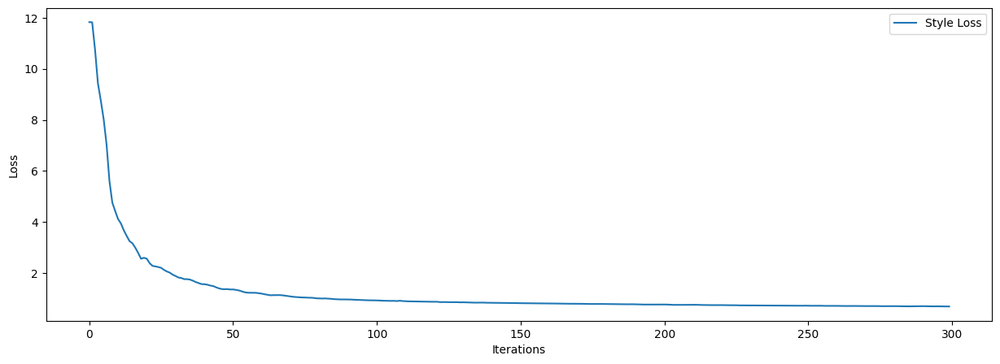

In [75]:
plt.figure(figsize=(15, 5))
plt.plot(style_losses_lst, label="Style Loss")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

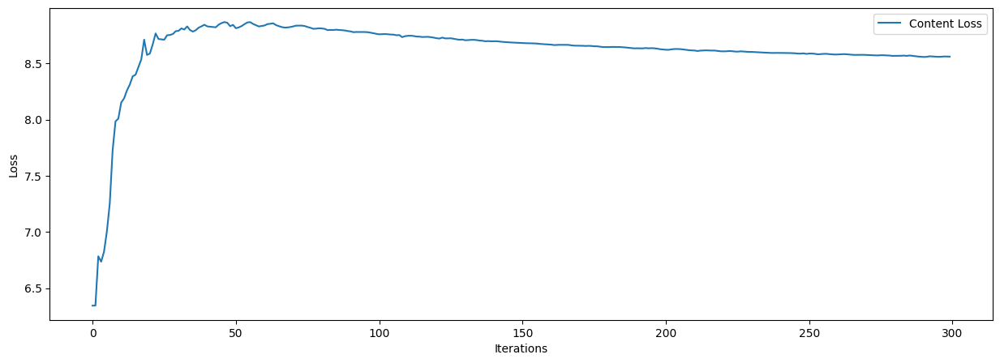

In [76]:
plt.figure(figsize=(15, 5))
plt.plot(content_losses_lst, label="Content Loss")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()